In [1]:
import numpy
import gzip
import numpy as np
import pandas as pd
import sys, glob
import urllib3
import h5py
import cdsapi, zipfile, os, time
import warnings
import shutil
import xarray
from datetime import date
warnings.filterwarnings('ignore')
import pycountry
import json

sys.path.append(os.path.expanduser("~")+'/CEUAS/CEUAS/public/cds-backend/code/')
import cds_eua4 as eua
sys.path.append(os.path.expanduser("~")+'/uvpy/')
import uvfunctions as uvf
import uvplot as uvp
import uvtests as uvt

import matplotlib
import matplotlib.pylab as plt
import matplotlib.pyplot as maplt
matplotlib.rcParams.update({'font.size': 20})
matplotlib.rcParams['figure.figsize'] = (20, 10)
font = {'family' : 'normal',
    # 'weight' : 'bold',
    'size'   : 20}
matplotlib.rc('font', **font)

from ipywidgets import IntProgress
from IPython.display import display
from IPython.display import Image

In [4]:
df = uvt.check_adjustments(
        directory = '/mnt/users/scratch/leo/scratch/converted_v11/long/',
        date_from = '2022-01-01',
        date_to = '2022-12-31'
)

IntProgress(value=0, max=12008)

,air_temperature_stations,RAOBCORE_bias_estimate,RAOBCORE_bias_estimate_std,RASE_bias_estimate,RASE_bias_estimate_std,RICH_bias_estimate,RICH_bias_estimate_std,RISE_bias_estimate,RISE_bias_estimate_std
0,0-20000-0-02365_CEUAS_merged_v1.nc,2240685,7069,1990427,6235,2240685,7069,1990427,6235
1,0-124-0-73033_CEUAS_merged_v1.nc,259131,9818,232714,9066,252609,9817,232714,9066
2,0-20000-0-02527_CEUAS_merged_v1.nc,904530,2516,847621,2292,904530,2516,847621,2292
3,0-20000-0-70414_CEUAS_merged_v1.nc,12027,4333,9644,3353,12027,4333,9644,3353
4,0-20000-0-47827_CEUAS_merged_v1.nc,2752257,11823,2668326,11182,2752257,11823,2668326,11182
...,...,...,...,...,...,...,...,...,...
717,0-20001-0-01028_CEUAS_merged_v1.nc,2836663,14976,2645311,14134,2836663,14976,2645311,14134
718,0-246-0-101104_CEUAS_merged_v1.nc,61937,20586,57661,19404,61937,20586,57661,19404
719,0-20001-0-01001_CEUAS_merged_v1.nc,2850002,13764,2512153,12612,2850002,13764,2512153,12612
720,0-20001-0-10548_CEUAS_merged_v1.nc,3969243,10318,3791331,9903,3969243,10318,3791331,9903


,wind_speed_stations,eastward_wind_speed,eastward_wind_speed_std,northward_wind_speed,northward_wind_speed_std
0,0-20000-0-02365_CEUAS_merged_v1.nc,2251551,7069,2251551,7069
1,0-124-0-73033_CEUAS_merged_v1.nc,325870,9812,325870,9812
2,0-20000-0-02527_CEUAS_merged_v1.nc,905501,2516,905501,2516
3,0-20000-0-70414_CEUAS_merged_v1.nc,14976,4351,14976,4351
4,0-20000-0-47827_CEUAS_merged_v1.nc,2775960,11824,2775960,11824
...,...,...,...,...,...
889,0-20999-0-YLV96WM_CEUAS_merged_v1.nc,76781,3085,76781,3085
890,0-620-2001-08536_CEUAS_merged_v1.nc,1405131,5312,1405131,5312
891,0-20999-0-XQFJRGX_CEUAS_merged_v1.nc,100535,3095,100535,3095
892,0-20999-0-XKQLWQB_CEUAS_merged_v1.nc,89185,2495,89185,2495


,relative_humidity_stations,relative_humidity,relative_humidity_std
0,0-20000-0-02365_CEUAS_merged_v1.nc,2251344,7069
1,0-124-0-73033_CEUAS_merged_v1.nc,266964,9817
2,0-20000-0-02527_CEUAS_merged_v1.nc,905327,2516
3,0-20000-0-70414_CEUAS_merged_v1.nc,12288,4320
4,0-20000-0-47827_CEUAS_merged_v1.nc,2772975,11799
...,...,...,...
849,0-20001-0-10548_CEUAS_merged_v1.nc,4078797,10216
850,0-20999-0-YLV96WM_CEUAS_merged_v1.nc,75140,3023
851,0-620-2001-08536_CEUAS_merged_v1.nc,1404951,5132
852,0-20999-0-XQFJRGX_CEUAS_merged_v1.nc,100395,2984


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


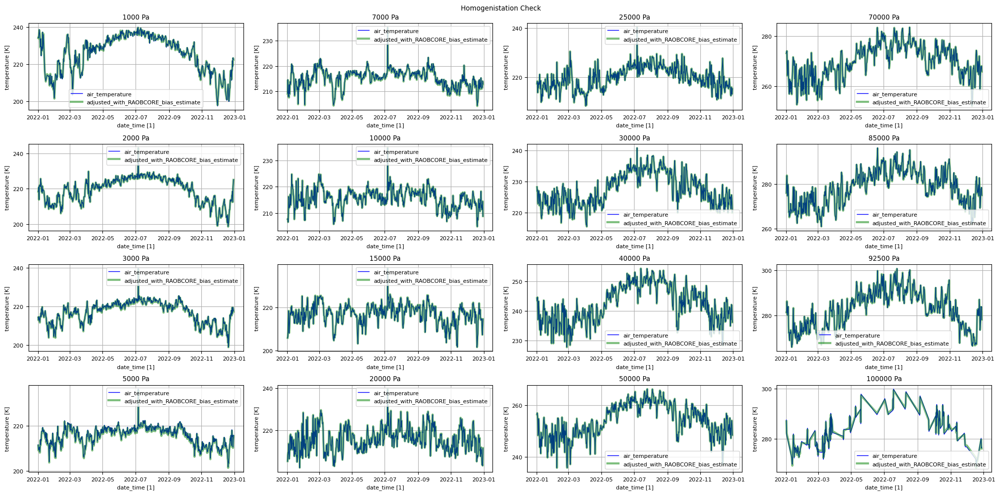

In [7]:
uvp.plot_std_plevs_from_file(
    file_name = glob.glob('/mnt/users/scratch/leo/scratch/converted_v11/long/*11035*_CEUAS_merged_v1.nc')[0],
    date_from = '2022-01-01',
    date_to = '2022-12-31',
    variable = 'air_temperature',
    adjusted = True,
    adjustment = 'RAOBCORE_bias_estimate'
)



,RAOBCORE_bias_estimate,RASE_bias_estimate,RICH_bias_estimate,RISE_bias_estimate,lat,lon,obs,plev,report_id,station_id,ta,time
0,NaN,NaN,NaN,NaN,48.248871,16.35759,0,380.0,100000000118586,WIEN/HOHE WARTE (11035-1),231.889999,2022-12-31 11:30:23
1,NaN,NaN,NaN,NaN,48.248871,16.35759,0,390.0,100000000118586,WIEN/HOHE WARTE (11035-1),231.759995,2022-12-31 11:30:23
2,NaN,NaN,NaN,NaN,48.248871,16.35759,0,400.0,100000000118586,WIEN/HOHE WARTE (11035-1),232.369995,2022-12-31 11:30:23
3,NaN,NaN,NaN,NaN,48.248871,16.35759,0,410.0,100000000118586,WIEN/HOHE WARTE (11035-1),232.880005,2022-12-31 11:30:23
4,NaN,NaN,NaN,NaN,48.248871,16.35759,0,420.0,100000000118586,WIEN/HOHE WARTE (11035-1),232.059998,2022-12-31 11:30:23
...,...,...,...,...,...,...,...,...,...,...,...,...
2528,0.498339,NaN,0.498339,NaN,48.248871,16.35759,0,99440.0,100000000118586,WIEN/HOHE WARTE (11035-1),279.660004,2022-12-31 11:30:23
2529,0.500930,NaN,0.500930,NaN,48.248871,16.35759,0,99470.0,100000000118586,WIEN/HOHE WARTE (11035-1),279.799988,2022-12-31 11:30:23
2530,0.506114,NaN,0.506114,NaN,48.248871,16.35759,0,99530.0,100000000118586,WIEN/HOHE WARTE (11035-1),279.920013,2022-12-31 11:30:23
2531,0.506978,NaN,0.506978,NaN,48.248871,16.35759,0,99540.0,100000000118586,WIEN/HOHE WARTE (11035-1),280.049988,2022-12-31 11:30:23


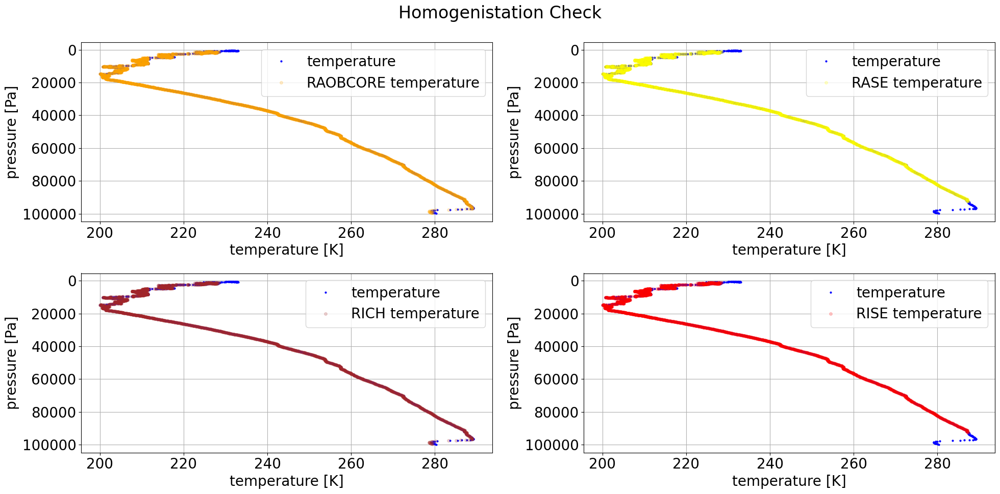

In [8]:
rq = {'variable': ['air_temperature'], 'statid': '11035', 'date': '20221231-20221231','optional': ['RAOBCORE_bias_estimate', 'RISE_bias_estimate', 'RASE_bias_estimate', 'RICH_bias_estimate',], 'format': 'nc'} # 0-20999-0-ZEKG

df = eua.vm_request_wrapper(rq , overwrite=True)# , vm_url='http://127.0.0.1:8009')

df = df.to_dataframe()
display(df)
# del df

fig, axs = plt.subplots(2,2)
fig.suptitle('Homogenistation Check')

axs[0][0].plot(df.ta, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='temperature')
axs[0][0].plot((df.ta - df.RAOBCORE_bias_estimate), df.plev, 'o', color = 'orange',markersize = 4, alpha = 0.2, label='RAOBCORE temperature')

axs[0][1].plot(df.ta, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='temperature')
axs[0][1].plot((df.ta - df.RASE_bias_estimate), df.plev, 'o', color = 'yellow',markersize = 4, alpha = 0.2, label='RASE temperature')

axs[1][0].plot(df.ta, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='temperature')
axs[1][0].plot((df.ta - df.RICH_bias_estimate), df.plev, 'o', color = 'brown',markersize = 4, alpha = 0.2, label='RICH temperature')

axs[1][1].plot(df.ta, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='temperature')
axs[1][1].plot((df.ta - df.RISE_bias_estimate), df.plev, 'o', color = 'red',markersize = 4, alpha = 0.2, label='RISE temperature')

for ax in axs.flat:
    ax.set(xlabel='temperature [K]', ylabel='pressure [Pa]', ylim=ax.get_ylim()[::-1])
    ax.set_title(None)
    ax.grid()
    ax.legend()

fig.tight_layout()
fig.show()


,humidity_bias_estimate,hur,lat,lon,obs,plev,report_id,station_id,time
0,0.0,0.010581,48.248871,16.35759,0,380.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23
1,0.0,0.010577,48.248871,16.35759,0,390.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23
2,0.0,0.010573,48.248871,16.35759,0,400.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23
3,0.0,0.010565,48.248871,16.35759,0,410.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23
4,0.0,0.010572,48.248871,16.35759,0,420.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23
...,...,...,...,...,...,...,...,...,...
2528,0.0,0.792027,48.248871,16.35759,0,99440.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23
2529,0.0,0.788326,48.248871,16.35759,0,99470.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23
2530,0.0,0.784618,48.248871,16.35759,0,99530.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23
2531,0.0,0.782605,48.248871,16.35759,0,99540.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23


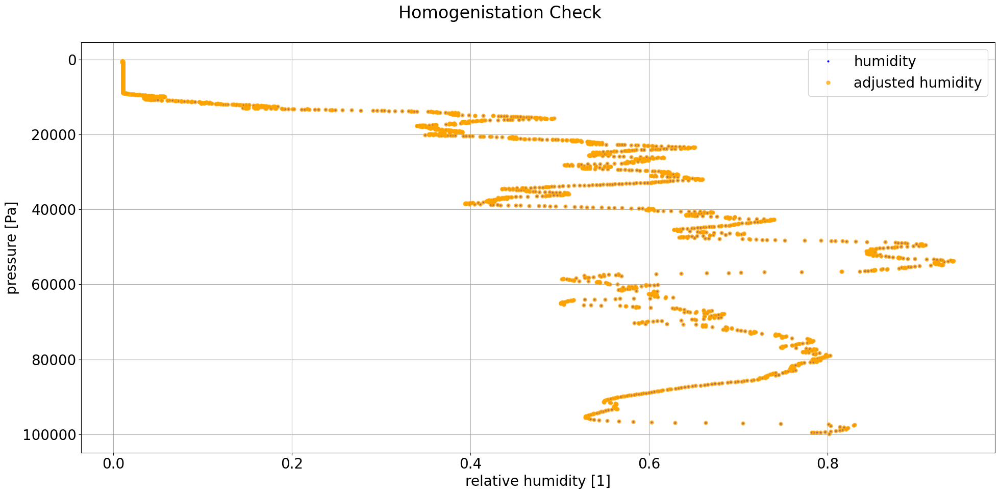

In [8]:
rq = {'variable': ['relative_humidity'], 'statid': '11035', 'date': '20221231-20221231','optional': ['humidity_bias_estimate',], 'format': 'nc'} # 0-20999-0-ZEKG

# df = eua.vm_request_wrapper(rq , overwrite=True , vm_url='http://127.0.0.1:8009')
df = eua.vm_request_wrapper(rq , overwrite = True, vm_url='http://127.0.0.1:8009')

df = df.to_dataframe()
display(df)
# del df

fig, axs = plt.subplots(1)
fig.suptitle('Homogenistation Check')

axs.plot(df.hur, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='humidity')
axs.plot((df.hur - df.humidity_bias_estimate), df.plev, 'o', color = 'orange',markersize = 5, alpha = 0.7, label='adjusted humidity')
axs.set(xlabel='relative humidity [1]', ylabel='pressure [Pa]', ylim=axs.get_ylim()[::-1])
axs.set_title(None)
axs.grid()
axs.legend()

fig.tight_layout()
fig.show()


,lat,lon,obs,plev,report_id,station_id,time,ua,wind_bias_estimate
0,48.248871,16.35759,0,380.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,74.686432,-2.235010e-06
1,48.248871,16.35759,0,390.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,86.784409,1.196655e-06
2,48.248871,16.35759,0,400.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,84.411598,-3.474570e-06
3,48.248871,16.35759,0,410.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,84.962601,-7.481032e-08
4,48.248871,16.35759,0,420.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,84.384399,-8.002264e-07
...,...,...,...,...,...,...,...,...,...
2528,48.248871,16.35759,0,99440.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,1.057515,8.114066e-09
2529,48.248871,16.35759,0,99470.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,1.098807,-2.301110e-08
2530,48.248871,16.35759,0,99530.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,1.016842,-3.241820e-08
2531,48.248871,16.35759,0,99540.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,1.016842,-3.241820e-08


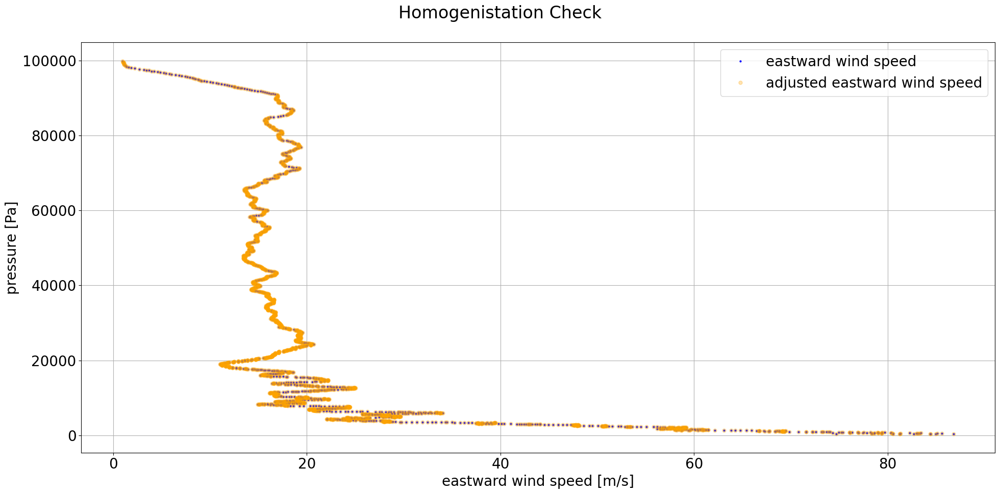

In [10]:
rq = {'variable': ['eastward_wind_speed'], 'statid': '11035', 'date': '20221231-20221231','optional': ['wind_bias_estimate',], 'format': 'nc'} # 0-20999-0-ZEKG

df = eua.vm_request_wrapper(rq , overwrite=True)# , vm_url='http://127.0.0.1:8009')

df = df.to_dataframe()
display(df)
# del df

fig, axs = plt.subplots(1)
fig.suptitle('Homogenistation Check')

axs.plot(df.ua, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='eastward wind speed')
axs.plot((df.ua - df.wind_bias_estimate), df.plev, 'o', color = 'orange',markersize = 5, alpha = 0.3, label='adjusted eastward wind speed')
axs.set(xlabel='eastward wind speed [m/s]', ylabel='pressure [Pa]', ylim=ax.get_ylim()[::-1])
axs.set_title(None)
axs.grid()
axs.legend()

fig.tight_layout()
fig.show()


,lat,lon,obs,plev,report_id,station_id,time,va,wind_bias_estimate
0,48.248871,16.35759,0,380.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-28.669436,4.625254e-07
1,48.248871,16.35759,0,390.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-35.063179,1.370709e-06
2,48.248871,16.35759,0,400.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-37.582466,3.153465e-07
3,48.248871,16.35759,0,410.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-36.064484,7.093986e-07
4,48.248871,16.35759,0,420.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,-30.713409,4.905796e-07
...,...,...,...,...,...,...,...,...,...
2528,48.248871,16.35759,0,99440.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,2.375218,2.963923e-08
2529,48.248871,16.35759,0,99470.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,2.356400,4.684958e-08
2530,48.248871,16.35759,0,99530.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,2.283864,-5.841765e-08
2531,48.248871,16.35759,0,99540.0,100000000118586,WIEN/HOHE WARTE (11035-1),2022-12-31 11:30:23,2.283864,-5.841765e-08


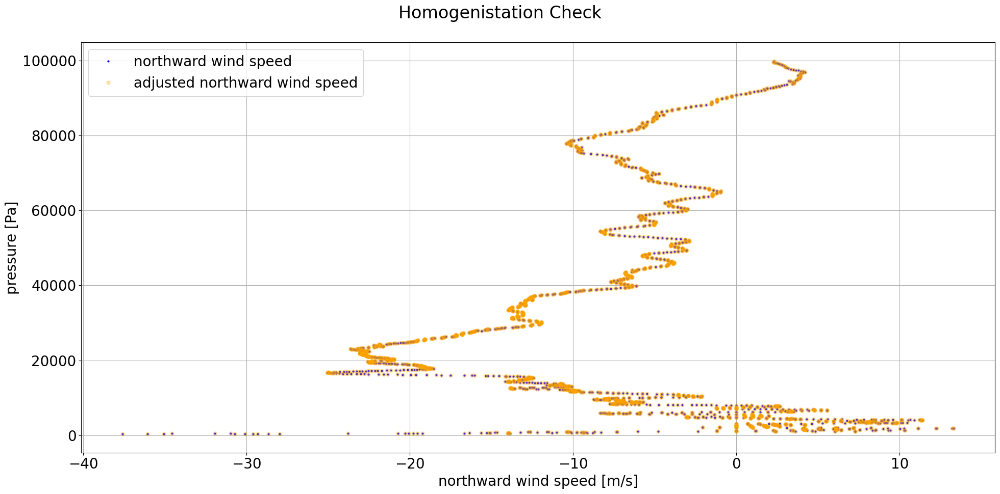

In [12]:
rq = {'variable': ['northward_wind_speed'], 'statid': '11035', 'date': '20221231-20221231','optional': ['wind_bias_estimate',], 'format': 'nc'} # 0-20999-0-ZEKG

df = eua.vm_request_wrapper(rq , overwrite=True)#  , vm_url='http://127.0.0.1:8009')

df = df.to_dataframe()
display(df)
# del df

fig, axs = plt.subplots(1)
fig.suptitle('Homogenistation Check')

axs.plot(df.va, df.plev, 'o', color = 'blue', markersize = 2, alpha = 1, label='northward wind speed')
axs.plot((df.va - df.wind_bias_estimate), df.plev, 'o', color = 'orange',markersize = 5, alpha = 0.3, label='adjusted northward wind speed')
axs.set(xlabel='northward wind speed [m/s]', ylabel='pressure [Pa]', ylim=ax.get_ylim()[::-1])
axs.set_title(None)
axs.grid()
axs.legend()

fig.tight_layout()
fig.show()


# 1946

IntProgress(value=0, max=172)

171 0


IntProgress(value=0, max=182)

181 0


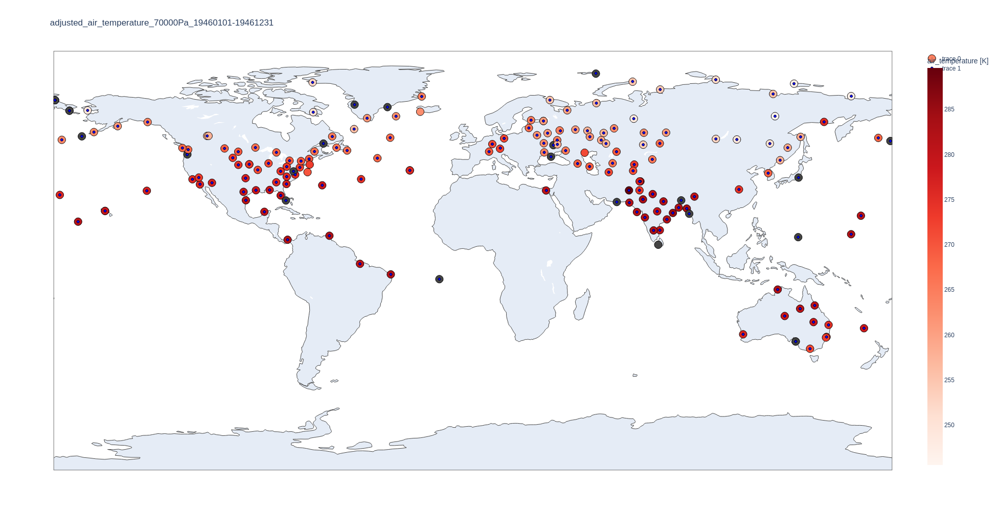

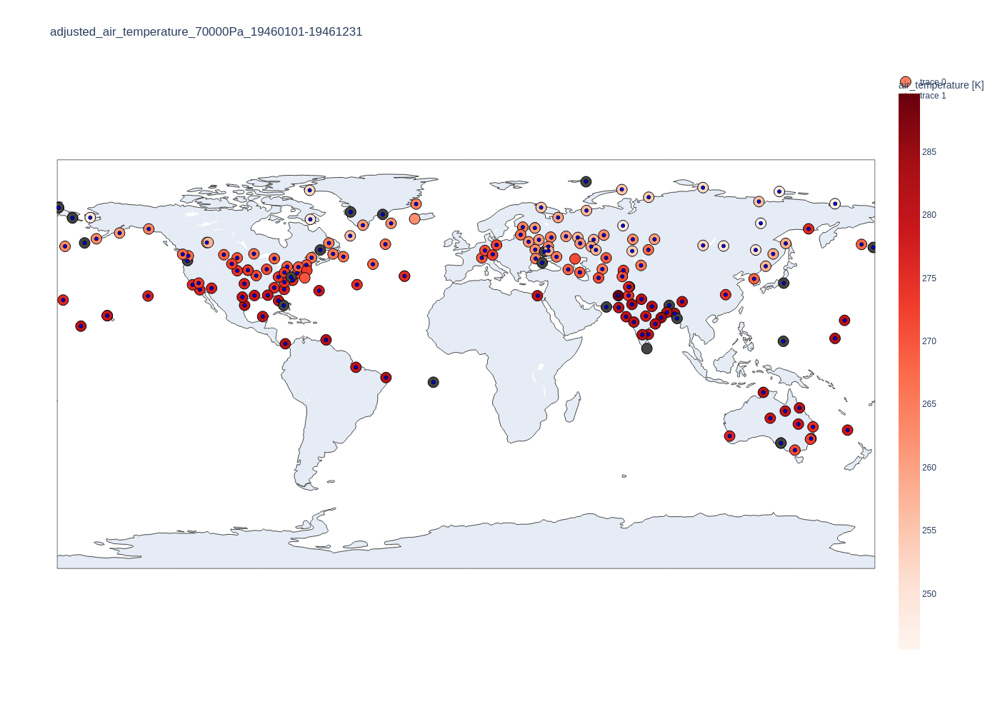

In [2]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'air_temperature',
    output_var =  'ta',
    adj = 'RAOBCORE_bias_estimate',
    date = '19460101-19461231',
    data_type = 'adjusted',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=586)

65 0


IntProgress(value=0, max=651)

68 0


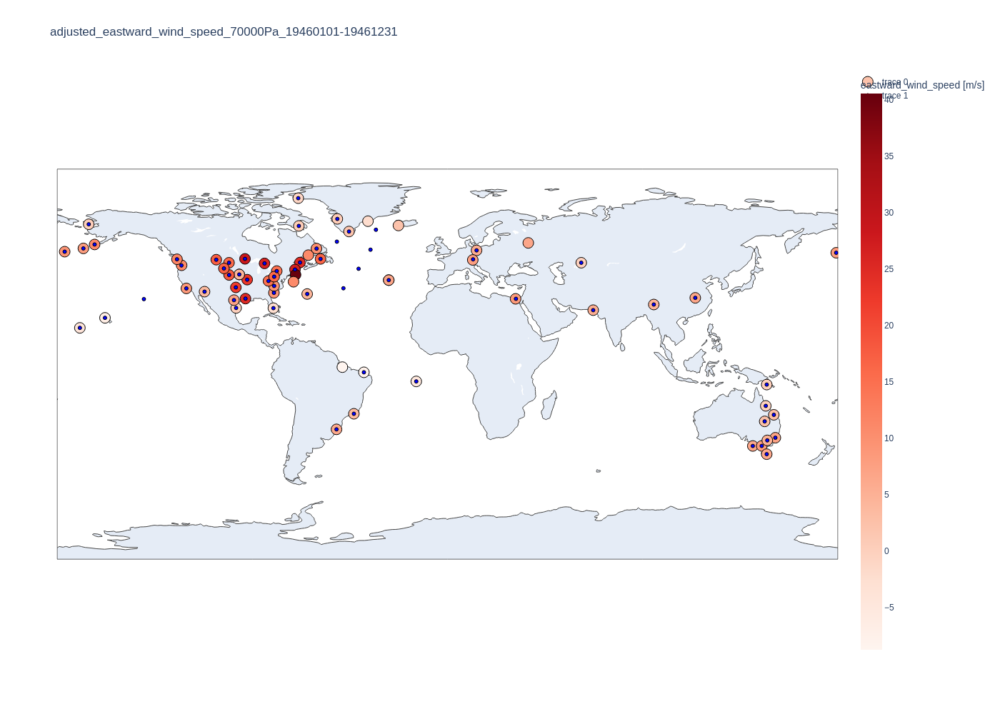

In [3]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19460101-19461231',
    data_type = 'adjusted',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=586)

65 0


IntProgress(value=0, max=651)

68 0


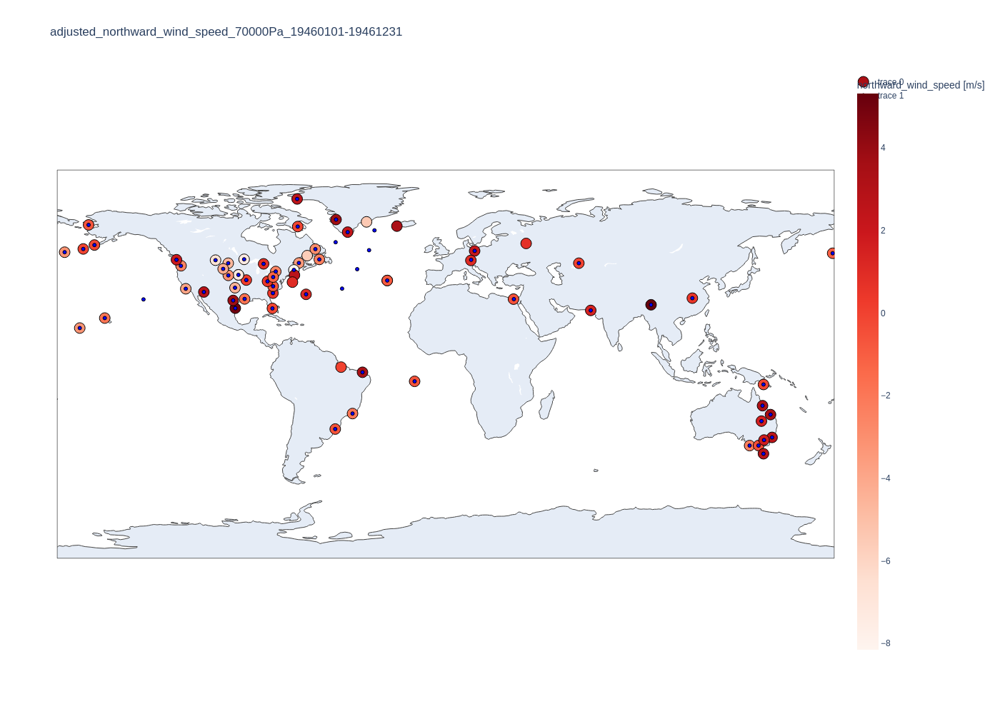

In [4]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19460101-19461231',
    data_type = 'adjusted',
) 
img = fig.to_image(format="png")
Image(img)

# 1925
---

IntProgress(value=0, max=31)

10 0


IntProgress(value=0, max=32)

10 0


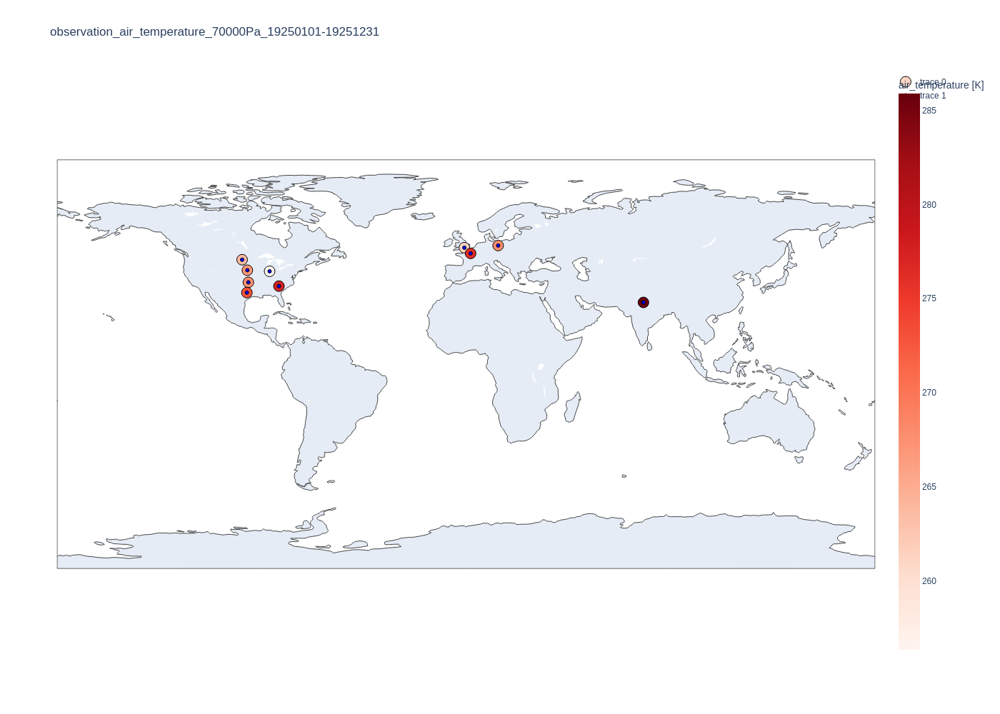

In [5]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'air_temperature',
    output_var =  'ta',
    adj = 'RAOBCORE_bias_estimate',
    date = '19250101-19251231',
    data_type = 'observation',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=31)

10 0


IntProgress(value=0, max=32)

10 0


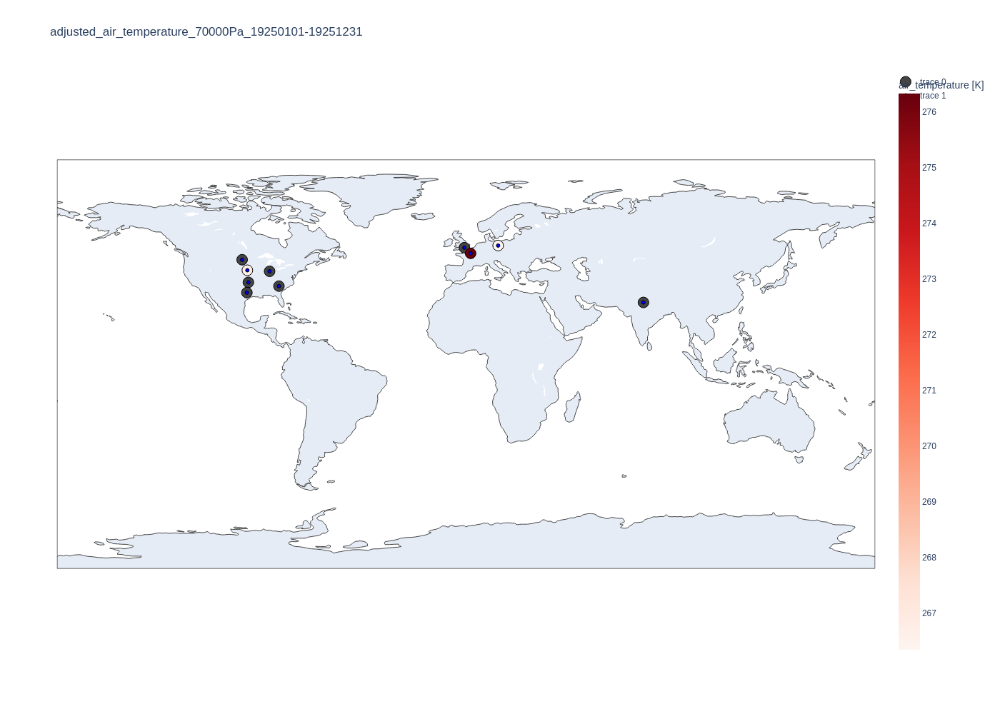

In [6]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'air_temperature',
    output_var =  'ta',
    adj = 'RAOBCORE_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=175)

0 0


IntProgress(value=0, max=180)

0 0


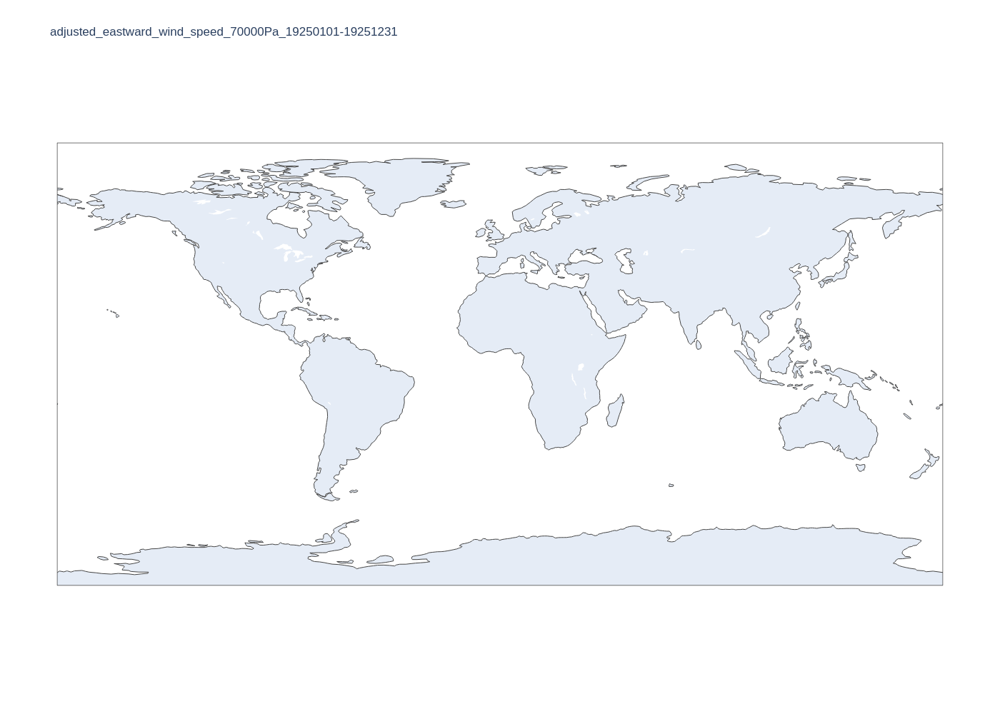

In [7]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=175)

0 0


IntProgress(value=0, max=180)

0 0


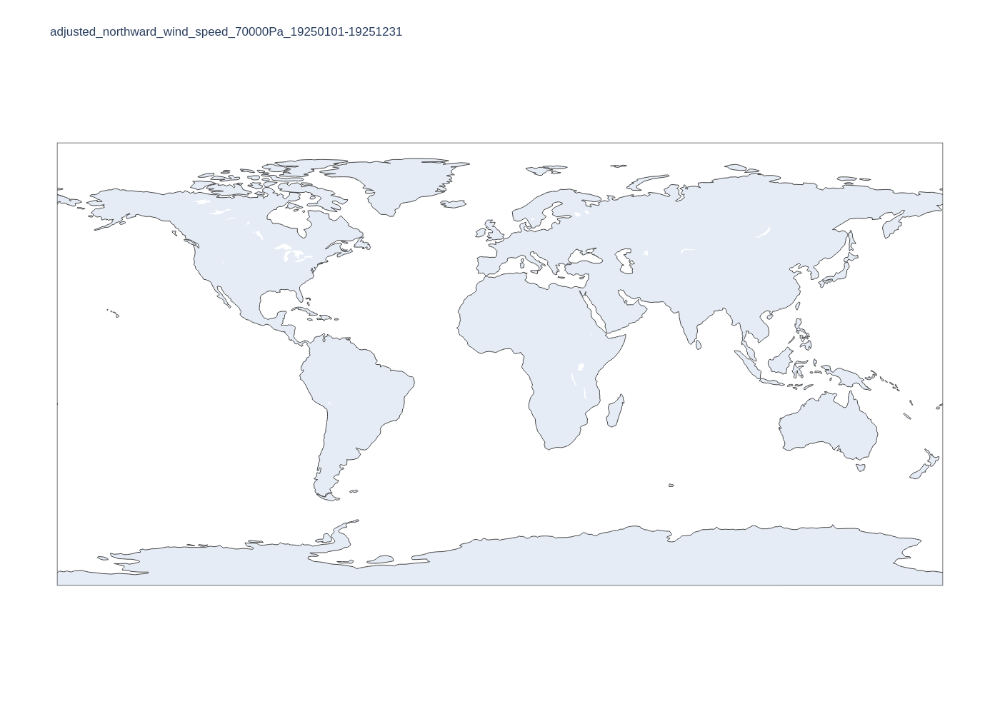

In [8]:
fig = uvp.cuon_world_map_2_version_comparison(
    plev = 70000,
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=175)

152 0


IntProgress(value=0, max=180)

156 0


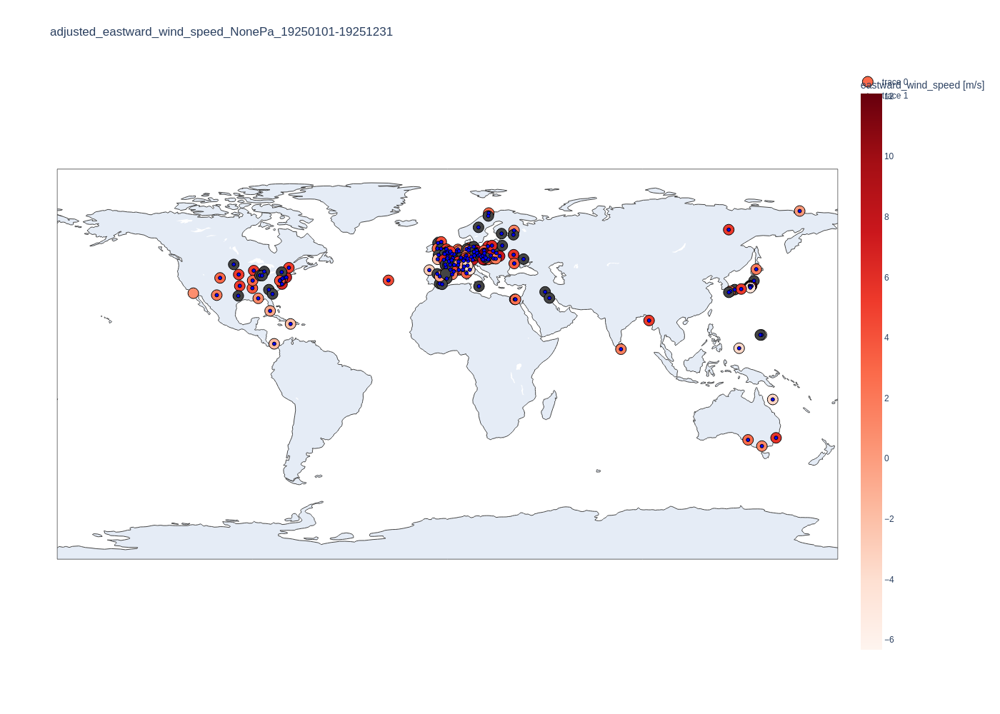

In [9]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=175)

152 0


IntProgress(value=0, max=180)

156 0


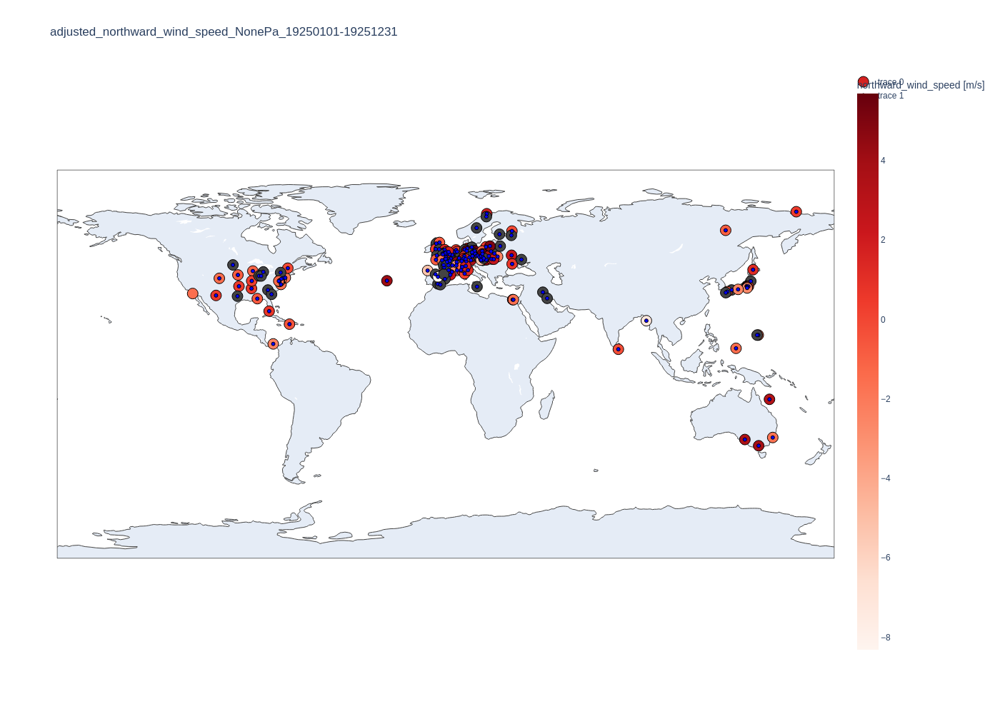

In [10]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19250101-19251231',
    data_type = 'adjusted',
) 
img = fig.to_image(format="png")
Image(img)

# 1945 0-72* only
---

IntProgress(value=0, max=62)

62 0


IntProgress(value=0, max=65)

65 0


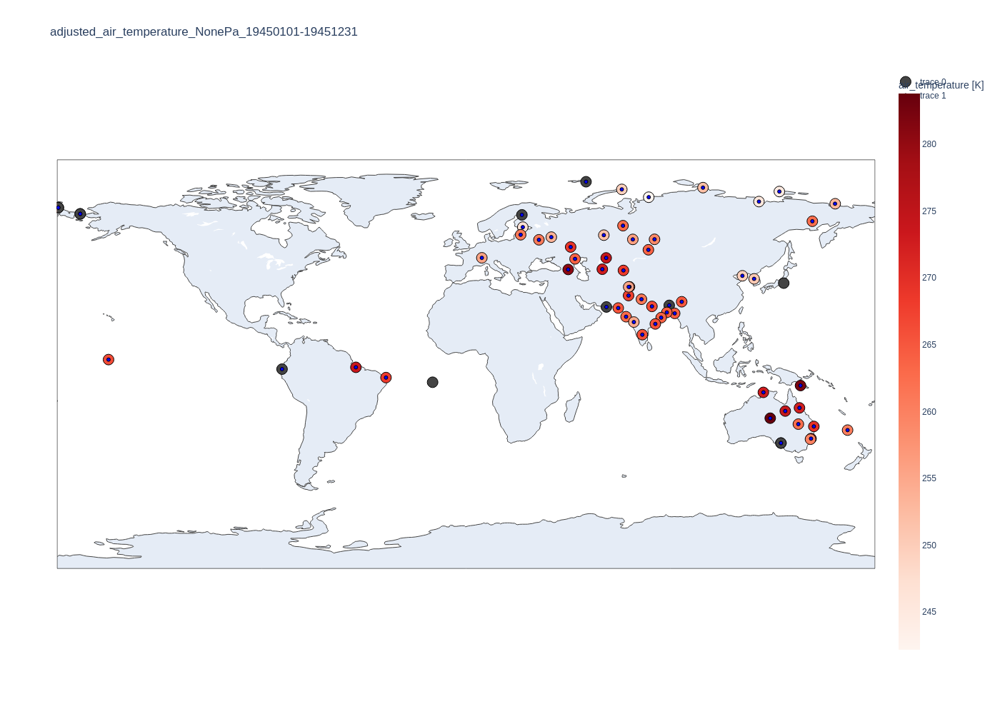

In [11]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'air_temperature',
    output_var =  'ta',
    adj = 'RAOBCORE_bias_estimate',
    date = '19450101-19451231',
    data_type = 'adjusted',
    statid = 'all',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=908)

907 1


IntProgress(value=0, max=968)

968 0


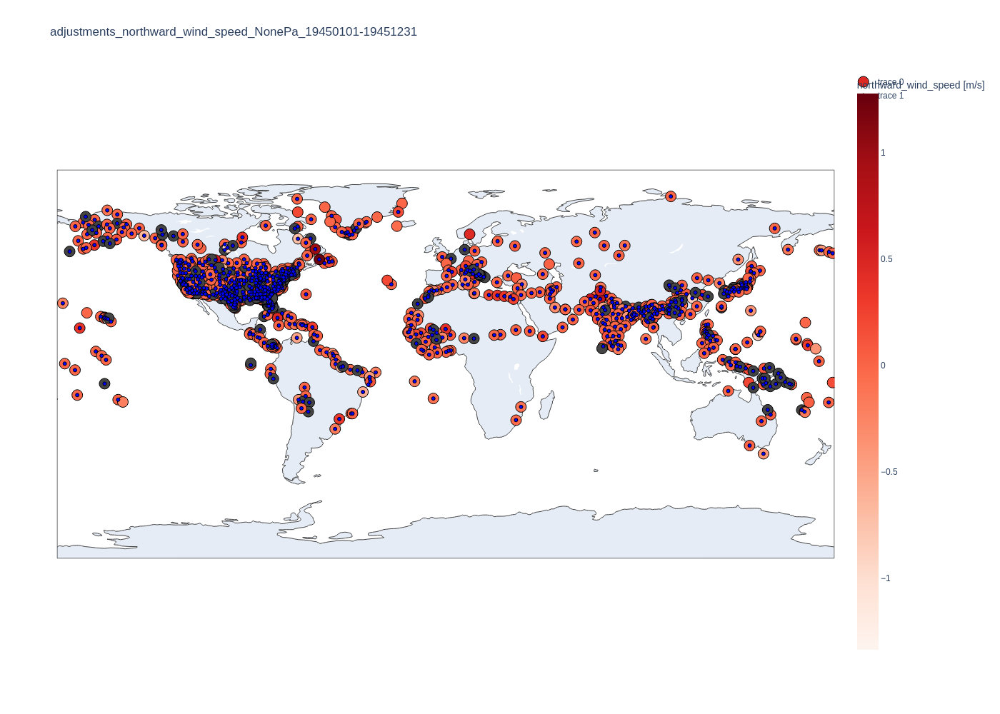

In [12]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19450101-19451231',
    data_type = 'adjustments',
    statid = 'all',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=908)

907 1


IntProgress(value=0, max=968)

968 0


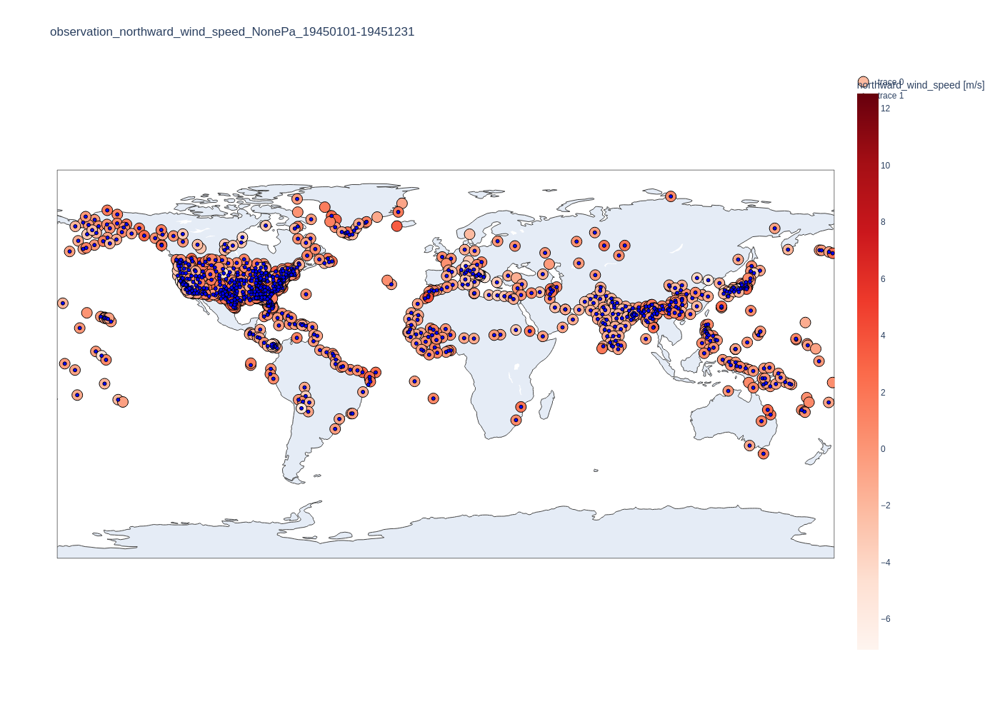

In [13]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'northward_wind_speed',
    output_var =  'va',
    adj = 'wind_bias_estimate',
    date = '19450101-19451231',
    data_type = 'observation',
    statid = 'all',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=908)

907 1


IntProgress(value=0, max=968)

968 0


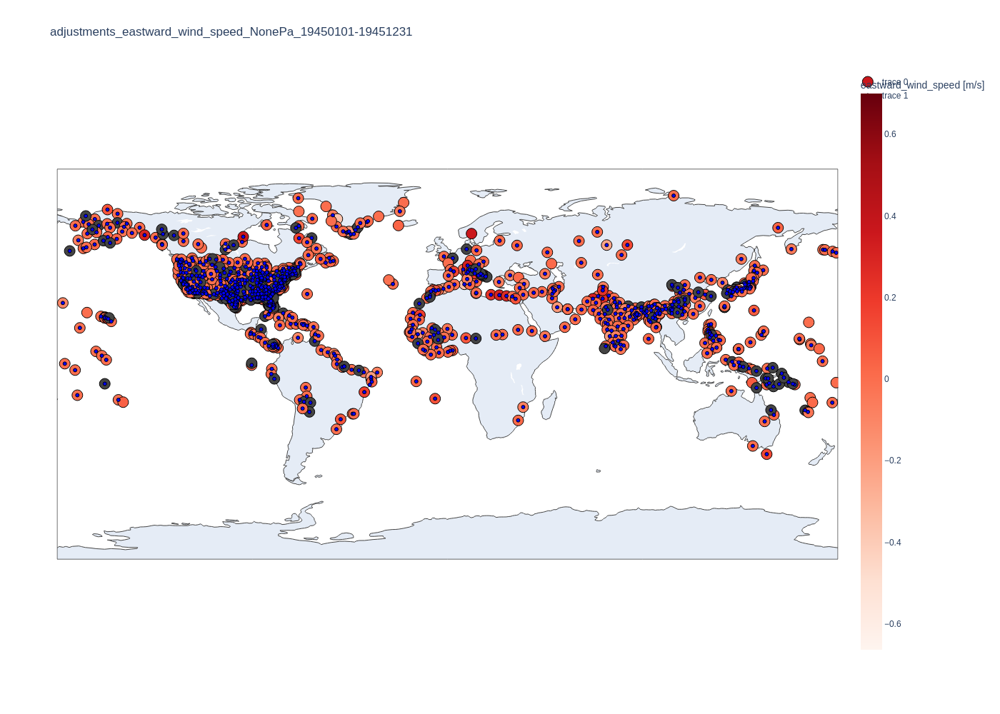

In [14]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19450101-19451231',
    data_type = 'adjustments',
    statid = 'all',
) 
img = fig.to_image(format="png")
Image(img)

IntProgress(value=0, max=908)

907 1


IntProgress(value=0, max=968)

968 0


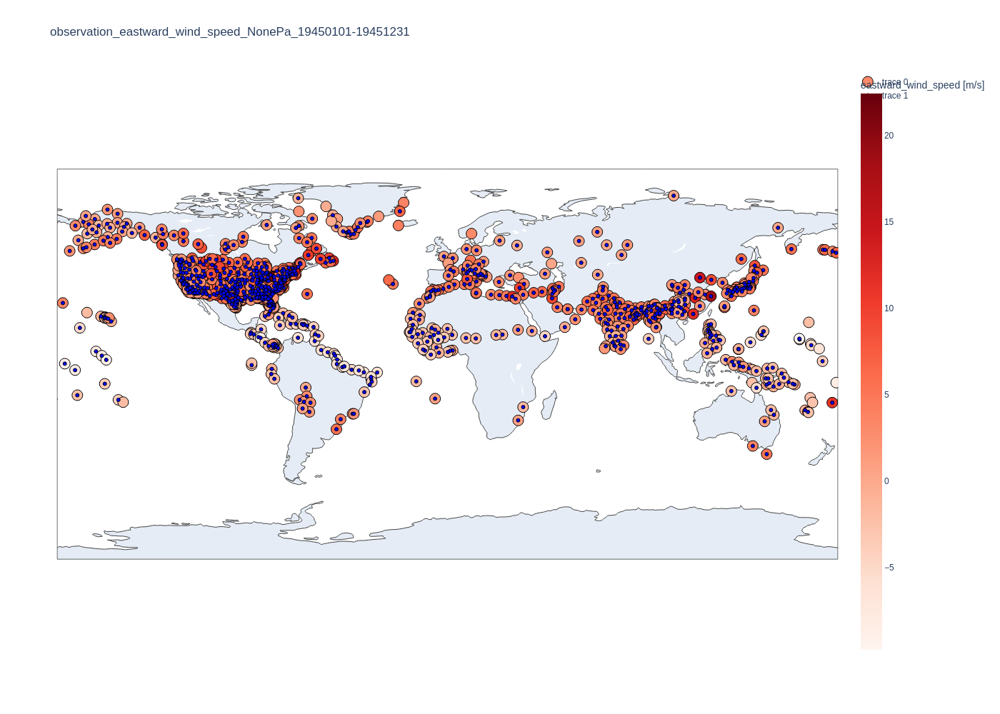

In [15]:
fig = uvp.cuon_world_map_2_version_comparison(
    var = 'eastward_wind_speed',
    output_var =  'ua',
    adj = 'wind_bias_estimate',
    date = '19450101-19451231',
    data_type = 'observation',
    statid = 'all',
) 
img = fig.to_image(format="png")
Image(img) 

## Trends in relative humidity

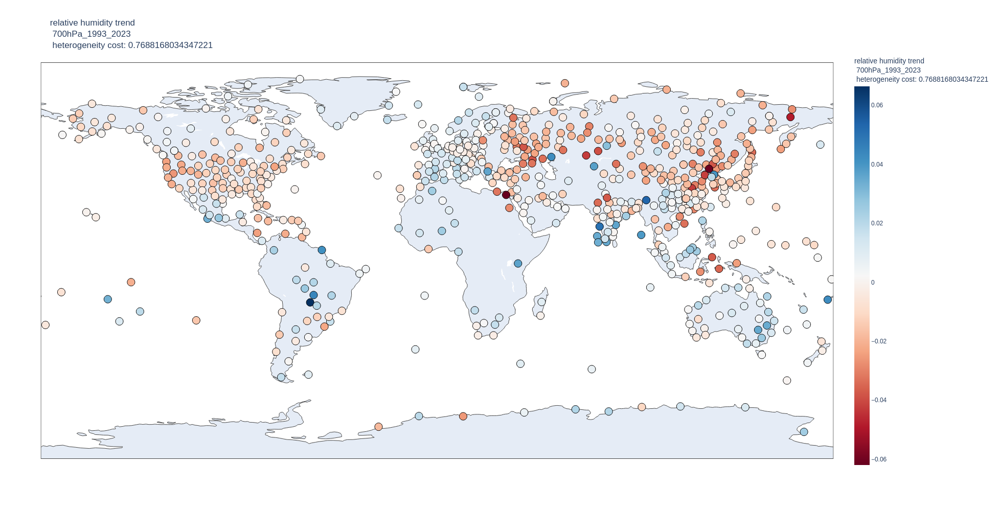

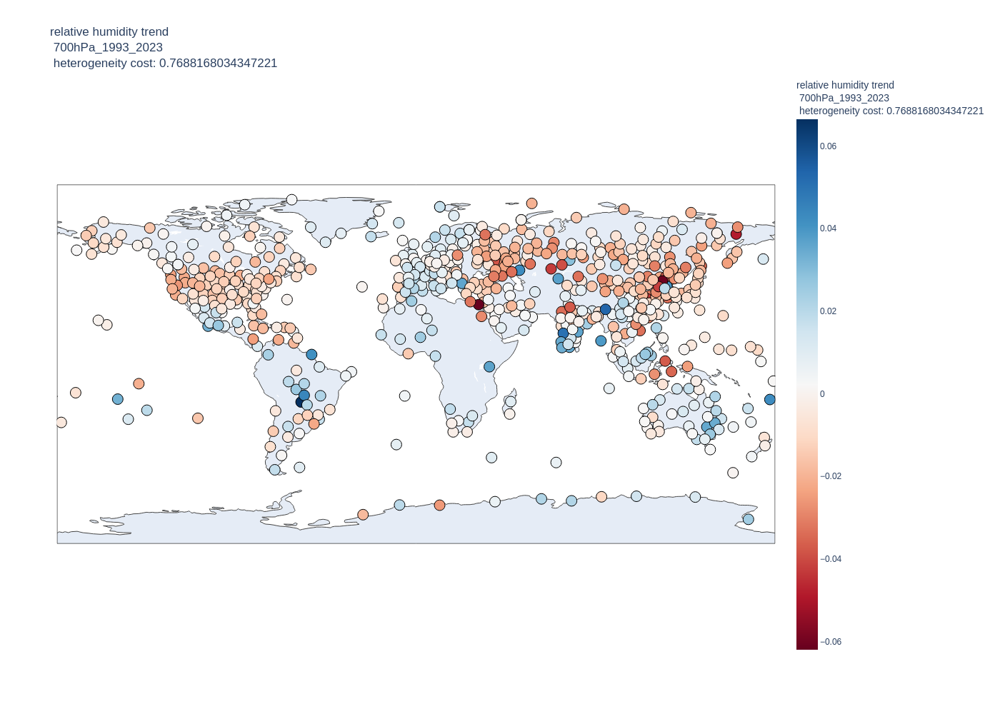

In [18]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('trends_700hPa_1993_2023_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 700hPa_1993_2023 <br> heterogeneity cost: ' + str(cost))

img = fig1.to_image(format="png")
Image(img) 



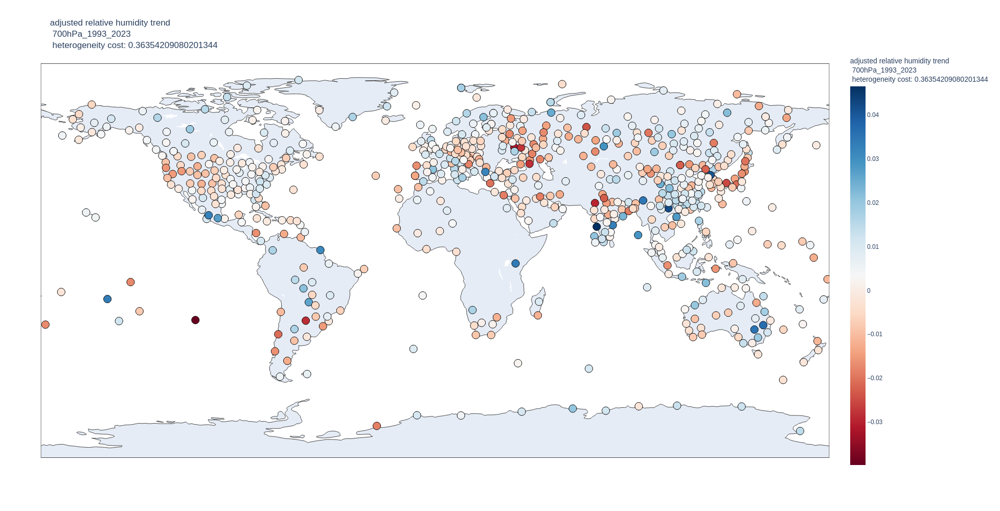

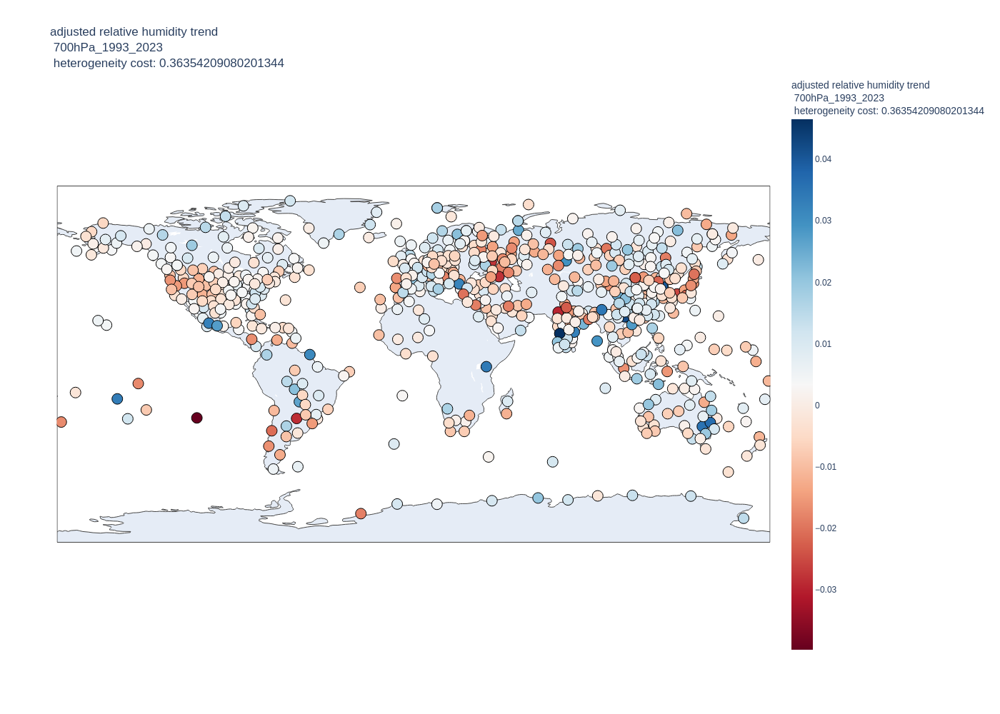

In [19]:
a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da['at']))
cost = np.sum(a)/len(a)
fig2 = uvp.world_map_plot(da['at'], da.lat, da.lon, da.label, 'adjusted relative humidity trend <br> 700hPa_1993_2023 <br> heterogeneity cost: ' + str(cost))

img = fig2.to_image(format="png")
Image(img) 

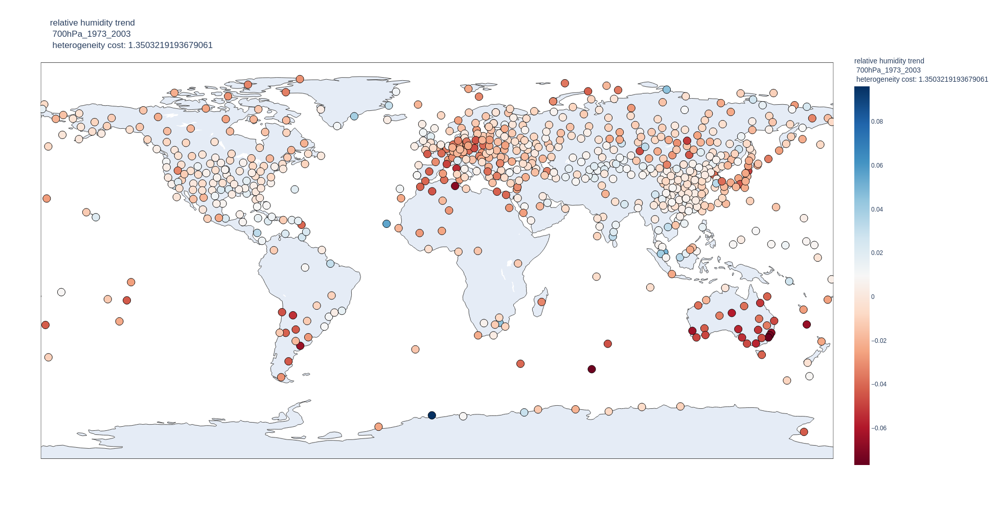

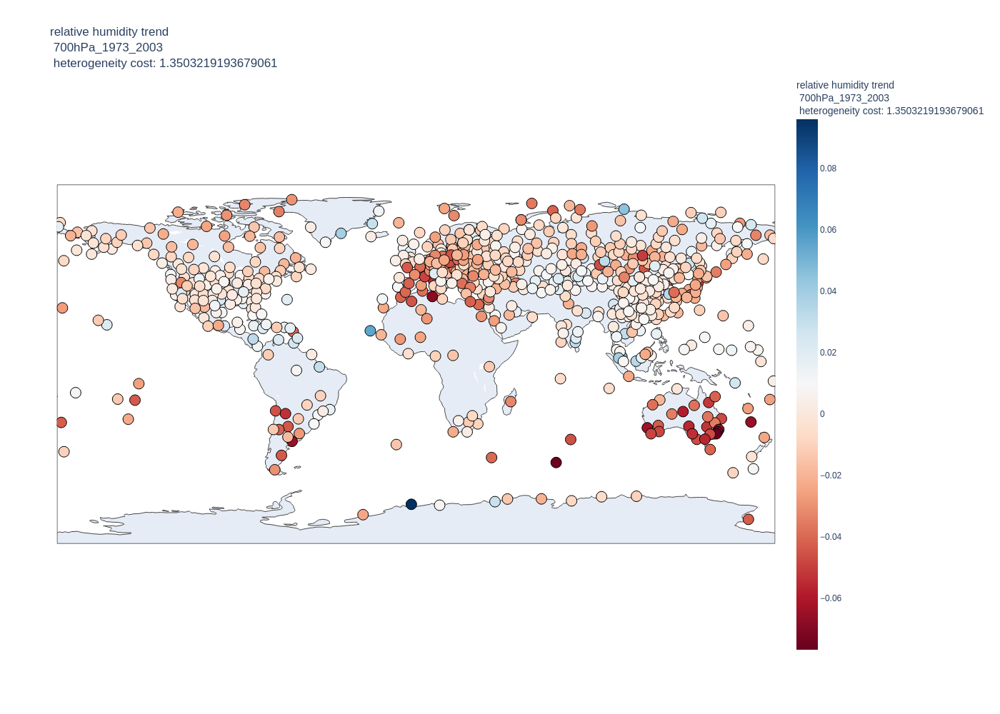

In [20]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('trends_700hPa_1973_2003_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 700hPa_1973_2003 <br> heterogeneity cost: ' + str(cost))

img = fig1.to_image(format="png")
Image(img) 



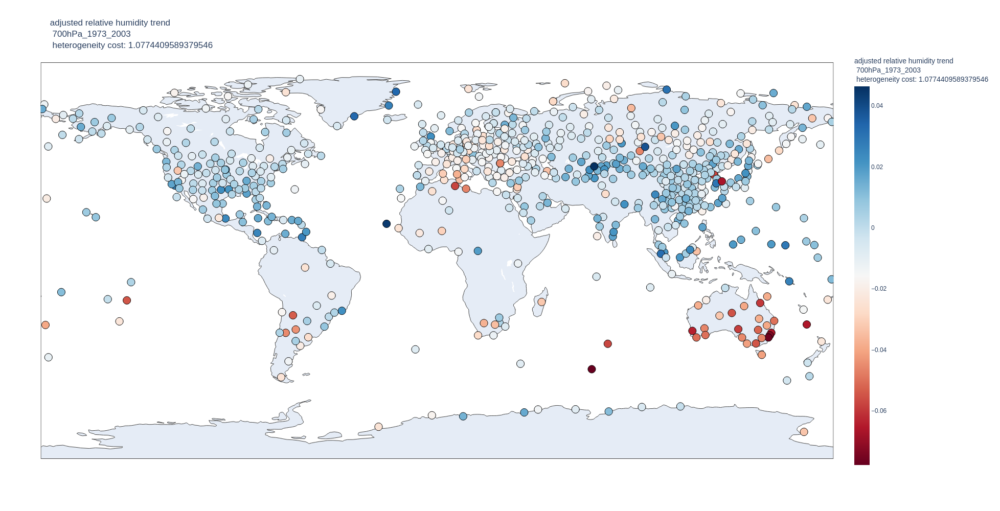

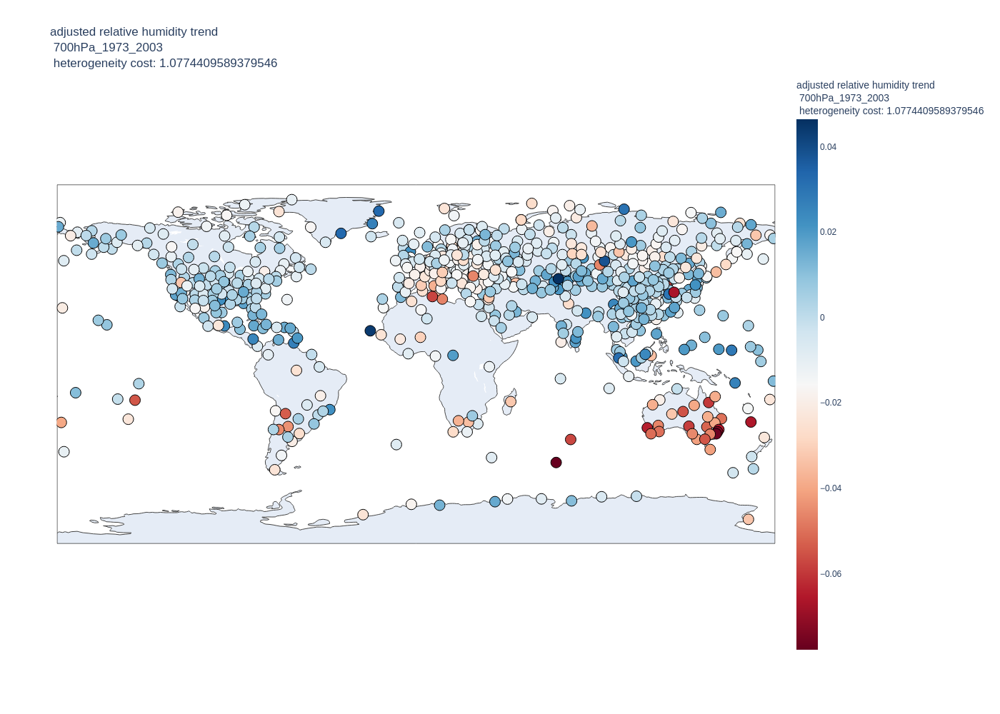

In [21]:
a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da['at']))
cost = np.sum(a)/len(a)
fig2 = uvp.world_map_plot(da['at'], da.lat, da.lon, da.label, 'adjusted relative humidity trend <br> 700hPa_1973_2003 <br> heterogeneity cost: ' + str(cost))

img = fig2.to_image(format="png")
Image(img) 

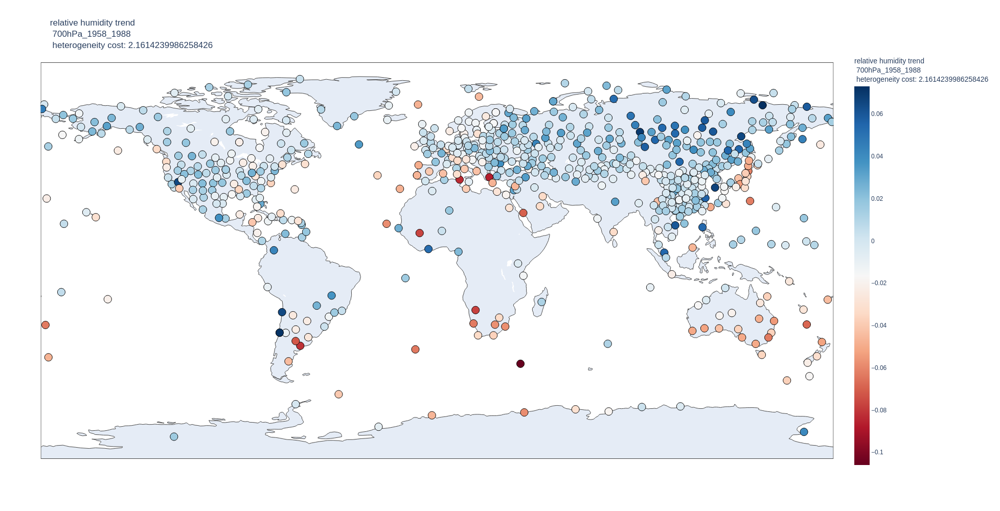

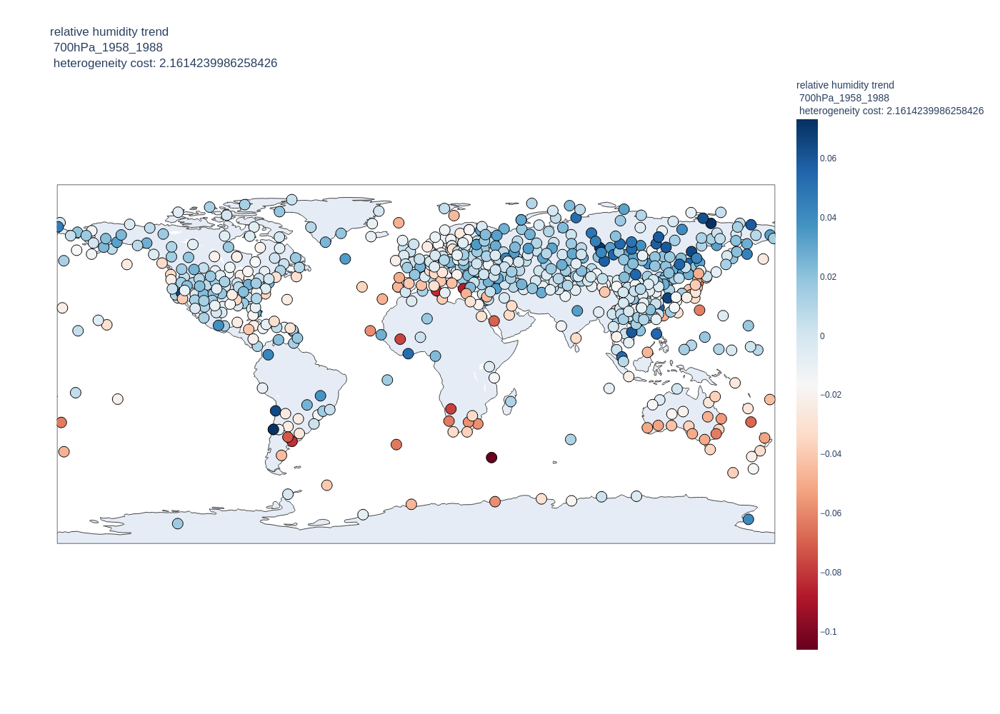

In [22]:
import pickle
sys.path.append(os.getcwd()+'/../resort/rasotools-master/')
import rasotools

good_results = {}
good_results['lat'] = []
good_results['lon'] = []
good_results['st'] = []
good_results['at'] = []
good_results['label'] = []
results = pickle.load(open('trends_700hPa_1958_1988_Trend.p', 'rb'))
for i in results:
    badflag = 0
    for j in i:
        try:
            if np.isnan(j):
                badflag = 1
        except:
            pass
    if badflag == 0:
        good_results['lat'].append(i[1])
        good_results['lon'].append(i[2])
        good_results['st'].append(i[3][0])
        good_results['at'].append(i[4][0])
        good_results['label'].append(i[0].split('/')[-1].split('_')[0])
da = pd.DataFrame.from_dict(good_results)

statnum = len(da)

a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da.st))
cost = np.sum(a)/len(a)
fig1 = uvp.world_map_plot(da.st, da.lat, da.lon, da.label, 'relative humidity trend <br> 700hPa_1958_1988 <br> heterogeneity cost: ' + str(cost))

img = fig1.to_image(format="png")
Image(img) 



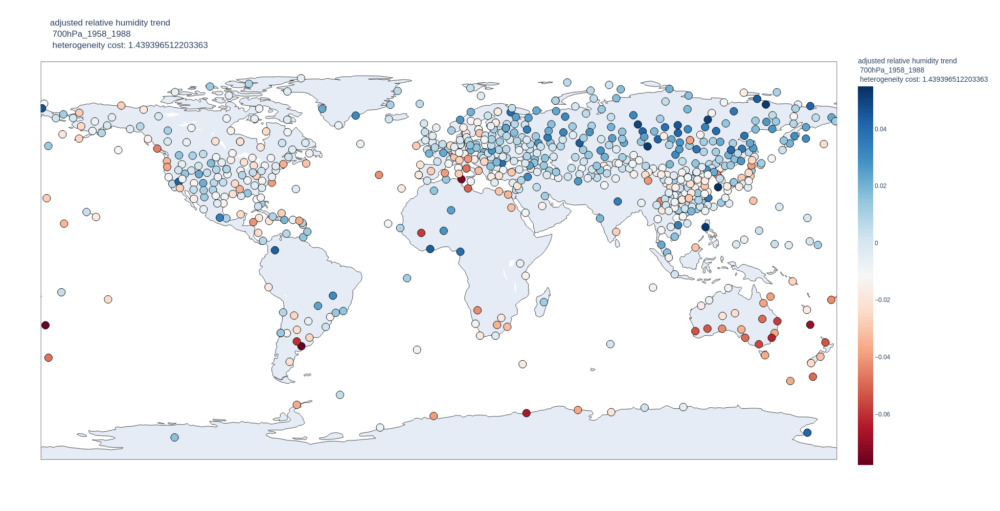

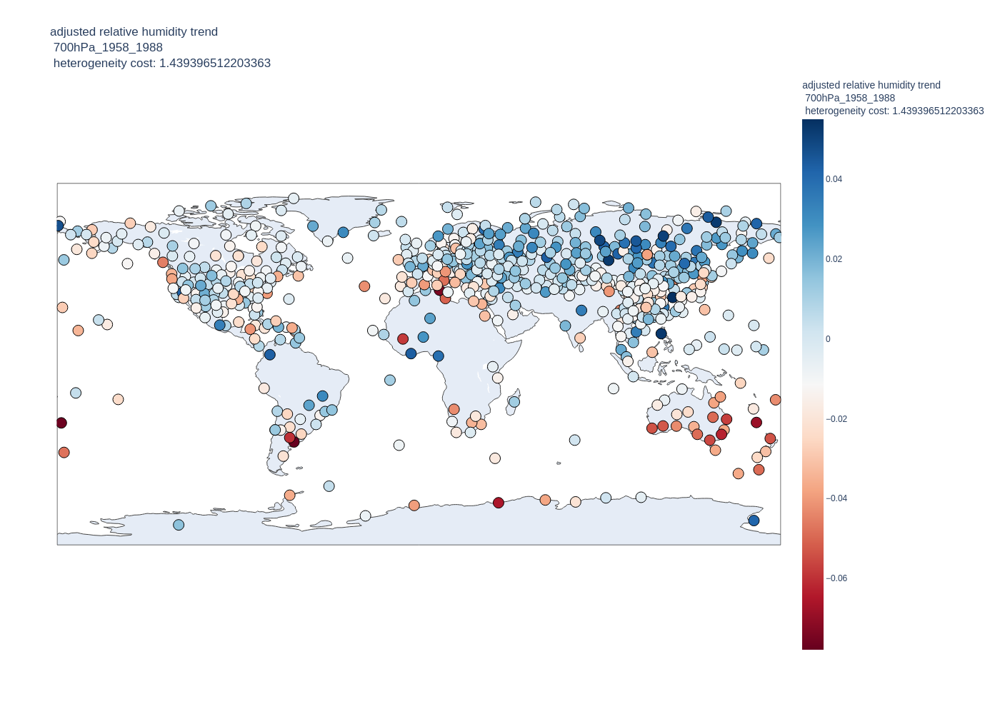

In [23]:
a = rasotools.plot._helpers.cost(np.asarray(da.lon), np.asarray(da.lat), np.asarray(da['at']))
cost = np.sum(a)/len(a)
fig2 = uvp.world_map_plot(da['at'], da.lat, da.lon, da.label, 'adjusted relative humidity trend <br> 700hPa_1958_1988 <br> heterogeneity cost: ' + str(cost))

img = fig2.to_image(format="png")
Image(img) 

In [27]:
rq = {'variable': 'air_temperature', 'statid': '0-20999*', 'date': '19781001-19781031'}
df = eua.vm_request_wrapper(rq )#, overwrite=True , vm_url='http://127.0.0.1:8009')

In [28]:
counter = 0
for i in df:
    if counter < 3:
        display(df[i])
    counter += 1
print(counter)

File: <HDF5 file "dest_0-20999-0-20744_air_temperature.nc" (mode r)>
Filesize: 0.04 MB
Filename: ./dest_0-20999-0-20744_air_temperature.nc
(G)roups/(V)ariables: 

 - V | lat__________________________________________ : : (2018,)
 - V | lon__________________________________________ : : (2018,)
 - V | obs__________________________________________ : : (2018,)
 - V | plev_________________________________________ : : (2018,)
 - V | report_id____________________________________ : : (2018, 21)
 - V | station_id___________________________________ : : (2018, 21)
 - V | ta___________________________________________ : : (2018,)
 - V | time_________________________________________ : : (2018,)

File: <HDF5 file "dest_0-20999-0-C7L_air_temperature.nc" (mode r)>
Filesize: 0.05 MB
Filename: ./dest_0-20999-0-C7L_air_temperature.nc
(G)roups/(V)ariables: 

 - V | lat__________________________________________ : : (3009,)
 - V | lon__________________________________________ : : (3009,)
 - V | obs__________________________________________ : : (3009,)
 - V | plev_________________________________________ : : (3009,)
 - V | report_id____________________________________ : : (3009, 21)
 - V | station_id___________________________________ : : (3009, 21)
 - V | ta___________________________________________ : : (3009,)
 - V | time_________________________________________ : : (3009,)

File: <HDF5 file "dest_0-20999-0-C7P_air_temperature.nc" (mode r)>
Filesize: 0.04 MB
Filename: ./dest_0-20999-0-C7P_air_temperature.nc
(G)roups/(V)ariables: 

 - V | lat__________________________________________ : : (1863,)
 - V | lon__________________________________________ : : (1863,)
 - V | obs__________________________________________ : : (1863,)
 - V | plev_________________________________________ : : (1863,)
 - V | report_id____________________________________ : : (1863, 21)
 - V | station_id___________________________________ : : (1863, 21)
 - V | ta___________________________________________ : : (1863,)
 - V | time_________________________________________ : : (1863,)

9


In [29]:
# with open('/users/staff/uvoggenberger/scratch/hug/config/active.json') as json_file:
#     data = json.load(json_file)
    
# slnum = list(data.keys())
# len(list(filter(lambda x: '20999' in x, slnum)))